In [1]:
import episcanpy as epi
import anndata as ad
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

import scanpy.external as sce


sc.set_figure_params(scanpy=True, dpi=80, dpi_save=250,
                     frameon=True, vector_friendly=True,
                     color_map="YlGnBu", format='pdf', transparent=False,
                     ipython_format='png2x')

In [2]:
DATADIR = ''

# Load processed data

In [3]:
# 10x data
adata10 = ad.read(DATADIR+'processed_10x_log1p_pre_integration_with_greenleaf.h5ad')
adata10.obs['dataset'] = ['10x Genomics' for n in adata10.obs_names.tolist()]
adata10

AnnData object with n_obs × n_vars = 10234 × 150513
    obs: 'nb_features', 'log_nb_features', 'n_counts', 'louvain', 'dataset'
    var: 'n_cells', 'commonness', 'prop_shared_cells', 'variability_score'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [4]:
adata10

AnnData object with n_obs × n_vars = 10234 × 150513
    obs: 'nb_features', 'log_nb_features', 'n_counts', 'louvain', 'dataset'
    var: 'n_cells', 'commonness', 'prop_shared_cells', 'variability_score'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

... storing 'dataset' as categorical


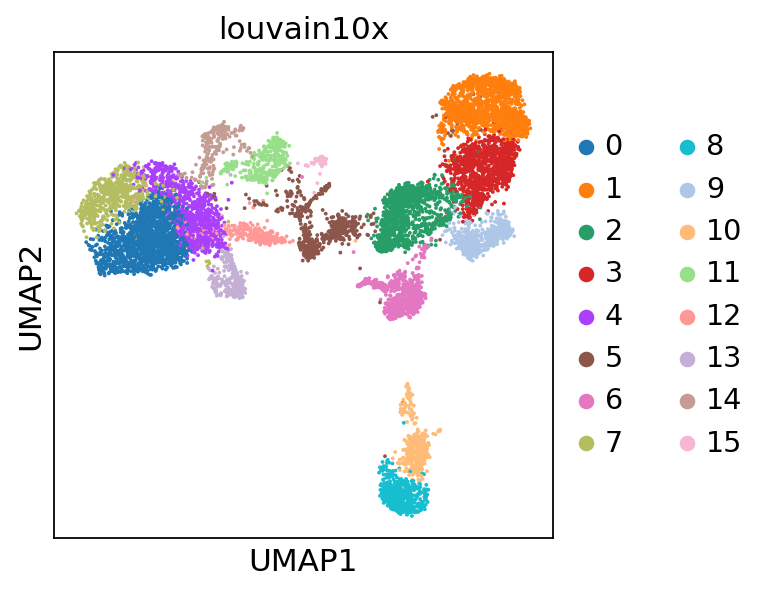

In [5]:
sc.tl.louvain(adata10, resolution=1,key_added='louvain10x')
sc.pl.umap(adata10, color=['louvain10x'])

... storing 'dataset' as categorical


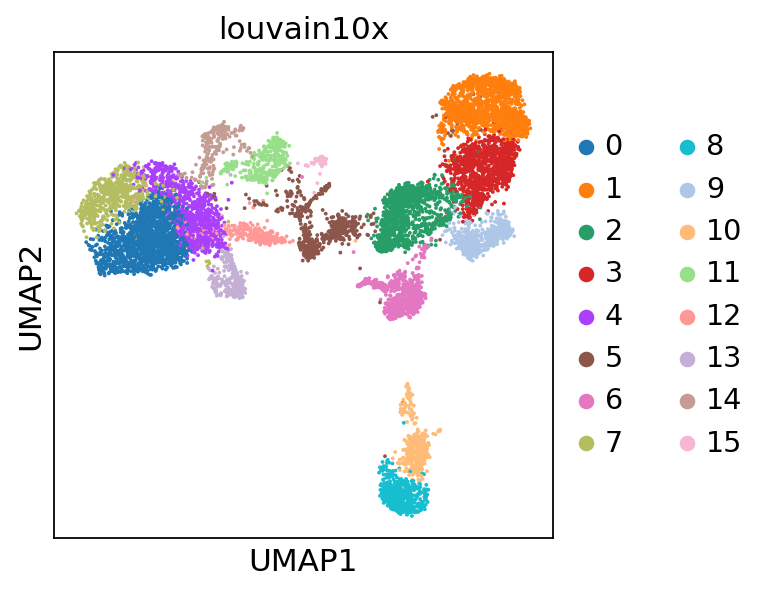

... storing '10x_cell_type_annot' as categorical


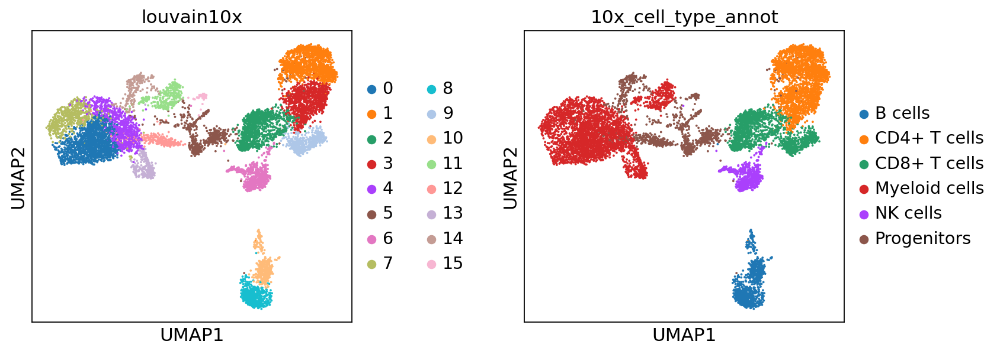

In [5]:
annot = []
for n in adata10.obs['louvain10x']:
    if n in ['5', '15', '14', '12']:
        annot.append('Progenitors')
    elif n in ['6']:
        annot.append('NK cells')
    elif n in ['0', '4', '7', '13', '11']:
        annot.append('Myeloid cells')
    elif n in ['8', '10']:
        annot.append('B cells')
    elif n in []:
        annot.append('Basophils')
    elif n in ['3', '1']:
        annot.append('CD4+ T cells')
    elif n in ['9', '2']:
        annot.append('CD8+ T cells')
    else:
        annot.append(n)
        
adata10.obs['10x_cell_type_annot'] = annot
sc.pl.umap(adata10, color=['louvain10x', '10x_cell_type_annot'], wspace=0.4)
adata10.obs['broad_annot'] = adata10.obs['10x_cell_type_annot'].copy()

In [6]:
# Greenleaf data
adataG = ad.read(DATADIR+'processed_greenleaf_for_bbknn_integration_log1p.h5ad')
adataG.obs['dataset'] = ['Greenleaf' for n in adataG.obs_names.tolist()]
adataG.obs['broad_annot_greenleaf'] = adataG.obs['broad_annot'].copy()
adataG

AnnData object with n_obs × n_vars = 52050 × 150051
    obs: 'batchname', 'nb_features', 'batch', 'GSM_id', 'file_name', 'cell_type', 'log_nb_features', 'n_counts', 'louvain', 'Group', 'clusters', 'cell_types', 'broad_annot', 'dataset', 'broad_annot_greenleaf'
    var: 'n_cells', 'commonness', 'prop_shared_cells', 'variability_score'
    uns: 'batchname_colors', 'broad_annot_colors', 'cell_type_colors', 'cell_types_colors', 'clusters_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [7]:
adata10.var_names

Index(['chr1_752417_752913', 'chr1_752456_752956', 'chr1_761853_762353',
       'chr1_779486_780265', 'chr1_793492_794334', 'chr1_800894_801394',
       'chr1_804853_805708', 'chr1_833858_834439', 'chr1_839236_839736',
       'chr1_839879_840379',
       ...
       'chrY_23235174_23236174', 'chrY_23336475_23337119',
       'chrY_23339275_23339651', 'chrY_23342711_23343212',
       'chrY_23354486_23355097', 'chrY_23418770_23419173',
       'chrY_23421908_23422652', 'chrY_23583781_23584499',
       'chrY_23602404_23602833', 'chrY_23898905_23899437'],
      dtype='object', length=150513)

## Concatenation

In [8]:
adata = adata10.concatenate(adataG)
adata

AnnData object with n_obs × n_vars = 62284 × 123280
    obs: 'nb_features', 'log_nb_features', 'n_counts', 'louvain', 'dataset', 'louvain10x', '10x_cell_type_annot', 'broad_annot', 'batchname', 'batch', 'GSM_id', 'file_name', 'cell_type', 'Group', 'clusters', 'cell_types', 'broad_annot_greenleaf'
    var: 'n_cells-0', 'commonness-0', 'prop_shared_cells-0', 'variability_score-0', 'n_cells-1', 'commonness-1', 'prop_shared_cells-1', 'variability_score-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    layers: 'counts'

In [9]:
epi.pp.lazy(adata)

... storing 'louvain' as categorical
... storing 'dataset' as categorical
... storing 'louvain10x' as categorical
... storing '10x_cell_type_annot' as categorical
... storing 'broad_annot' as categorical
... storing 'batchname' as categorical
... storing 'GSM_id' as categorical
... storing 'file_name' as categorical
... storing 'cell_type' as categorical
... storing 'Group' as categorical
... storing 'clusters' as categorical
... storing 'cell_types' as categorical
... storing 'broad_annot_greenleaf' as categorical


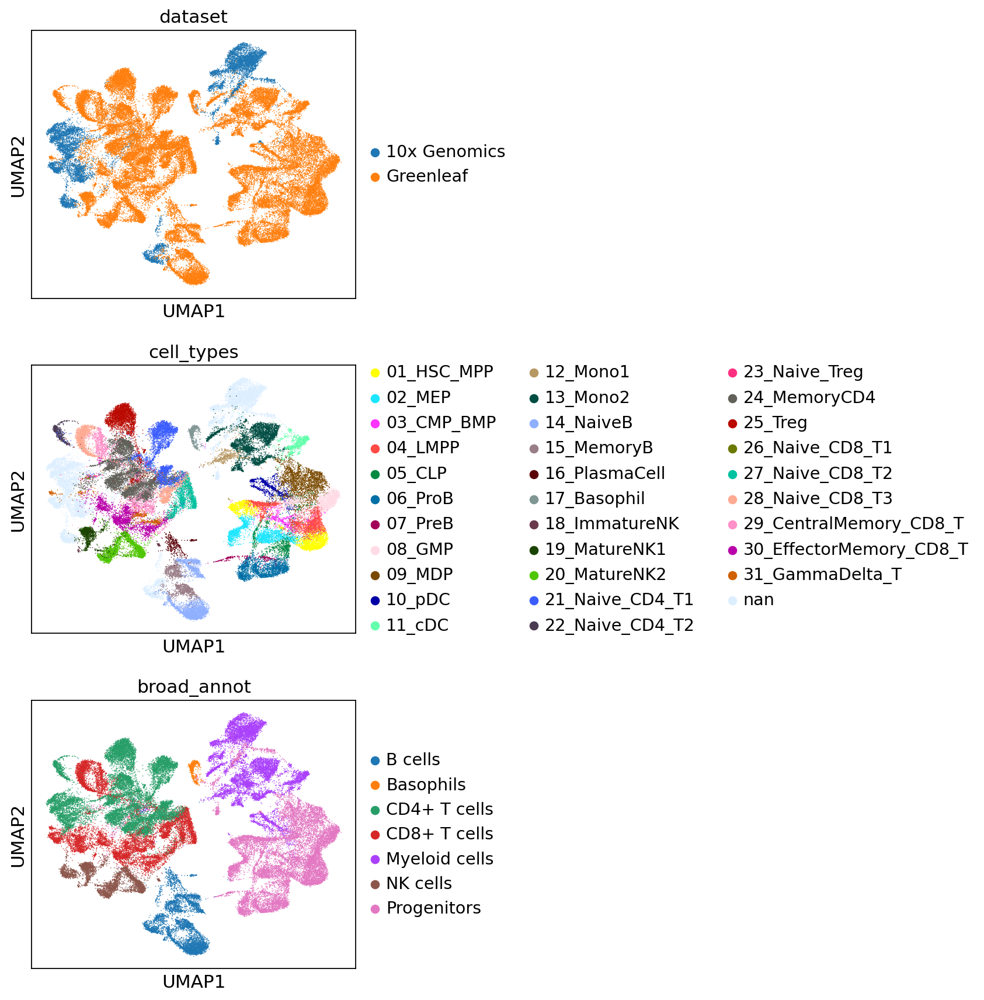

In [10]:
sc.pl.umap(adata,
           color=['dataset'],
          ncols=1, save='pre_integration_greenleaf_10x_dataset.png')
sc.pl.umap(adata,
           color=['cell_types'],
          ncols=1, save='pre_integration_greenleaf_10x_cell_types.png')
sc.pl.umap(adata,
           color=['broad_annot'],
          ncols=1, save='pre_integration_greenleaf_10x_broad_annot.png')
sc.pl.umap(adata,
           color=['GSM_id'],
          ncols=1, save='pre_integration_greenleaf_10x_GSM_id.png')

In [11]:
# creating the sample + dataset annotation.
annot = []
for n in adata.obs['GSM_id']:
    if n == 'nan':
        annot.append('10X Genomics')
    else:
        annot.append('Greenleaf_'+n)
adata.obs['dataset_GSM'] = annot

## BBKNN integration on datasets

... storing 'dataset_GSM' as categorical


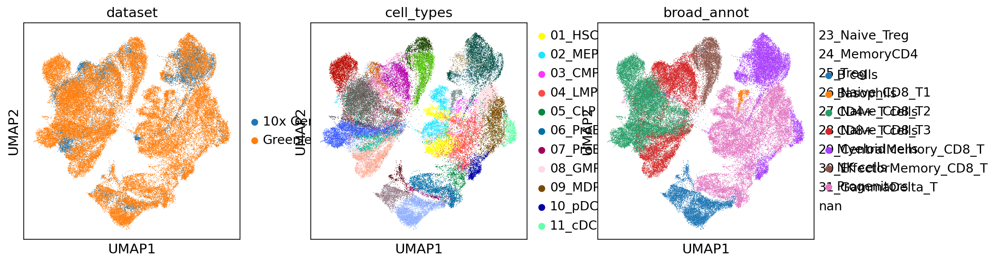

In [12]:
sce.pp.bbknn(adata, batch_key='dataset')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['dataset', 'cell_types', 'broad_annot'])

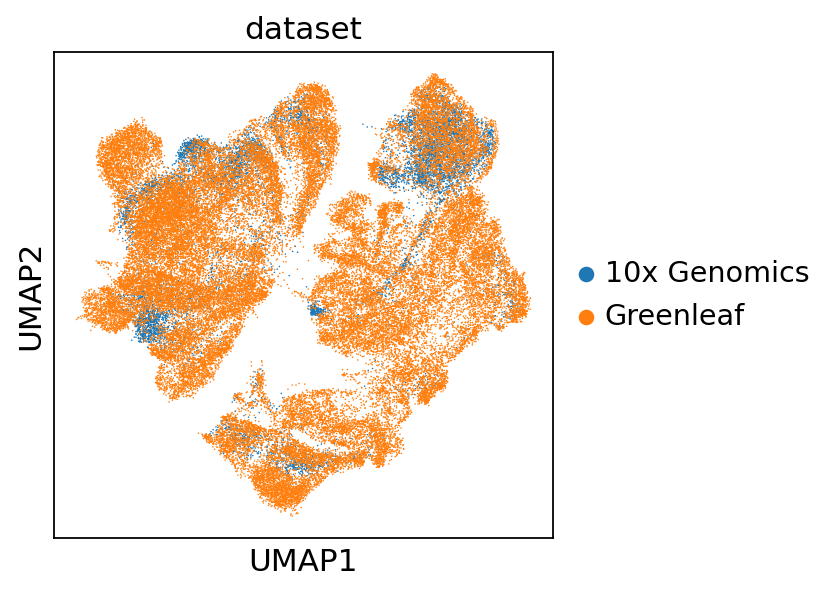

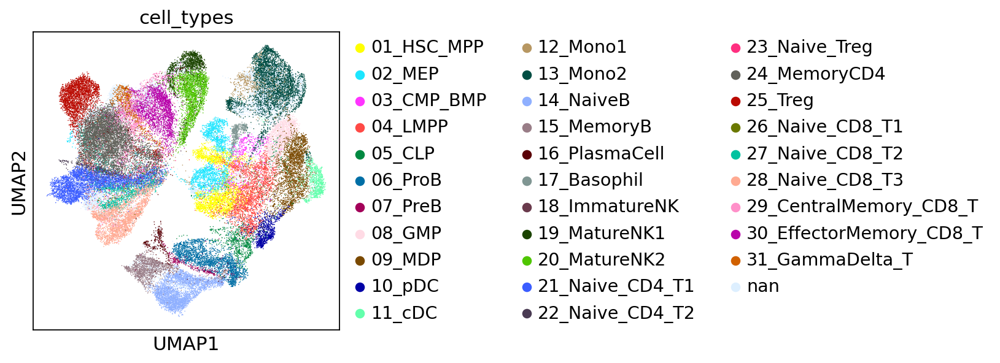

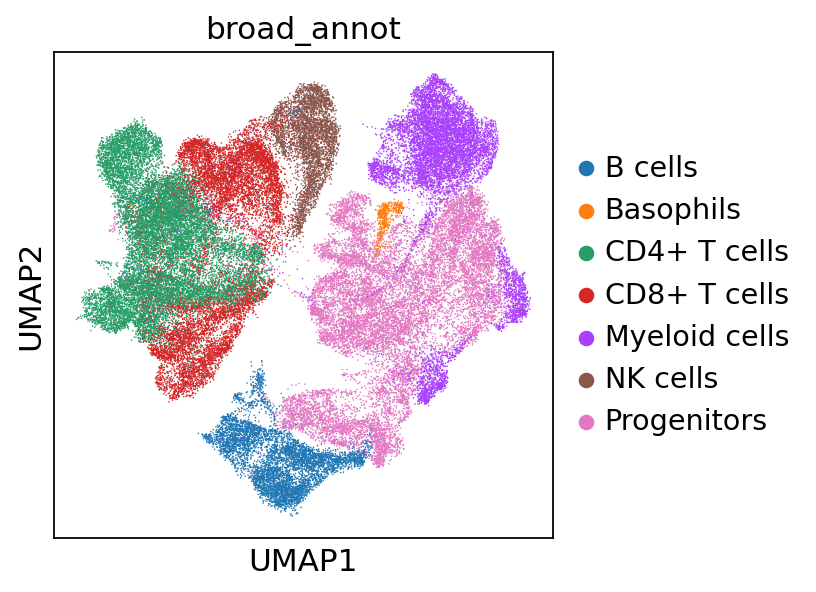

In [14]:
sc.pl.umap(adata, color=['dataset'], save='dataset_bbknn_dataset.png')
sc.pl.umap(adata, color=['cell_types'], save='dataset_bbknn_cell_types.png')
sc.pl.umap(adata, color=['broad_annot'], save='dataset_bbknn_broad_annot.png')
sc.pl.umap(adata, color=['dataset_GSM'], save='dataset_bbknn_dataset_GSM.png')

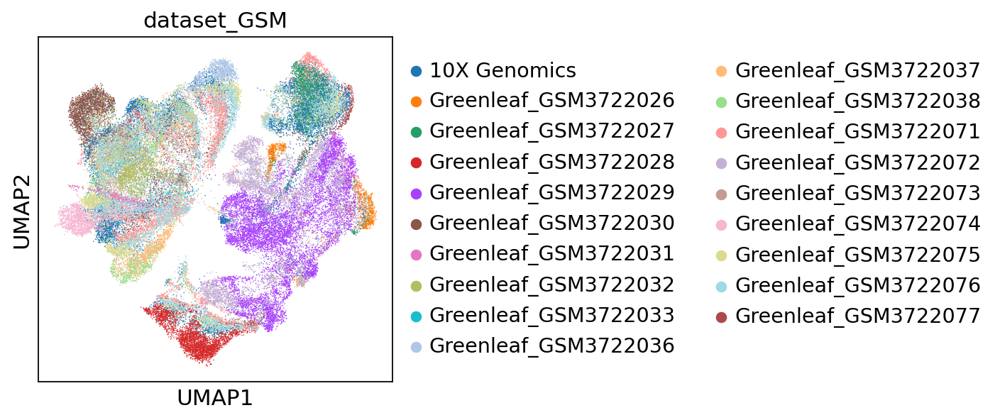

# bbnn integration on dataset_GSM

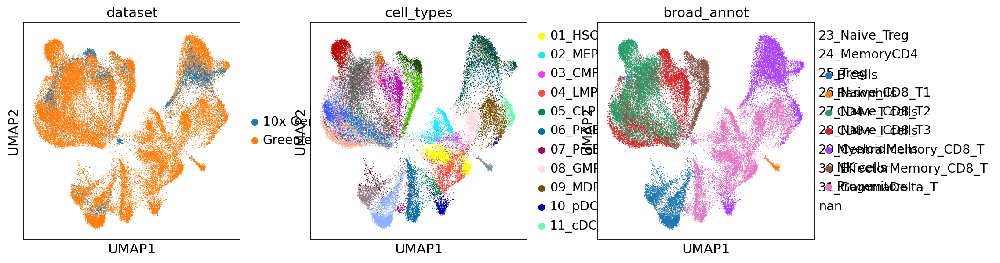

In [16]:
sce.pp.bbknn(adata, batch_key='dataset_GSM')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['dataset', 'cell_types', 'broad_annot'])

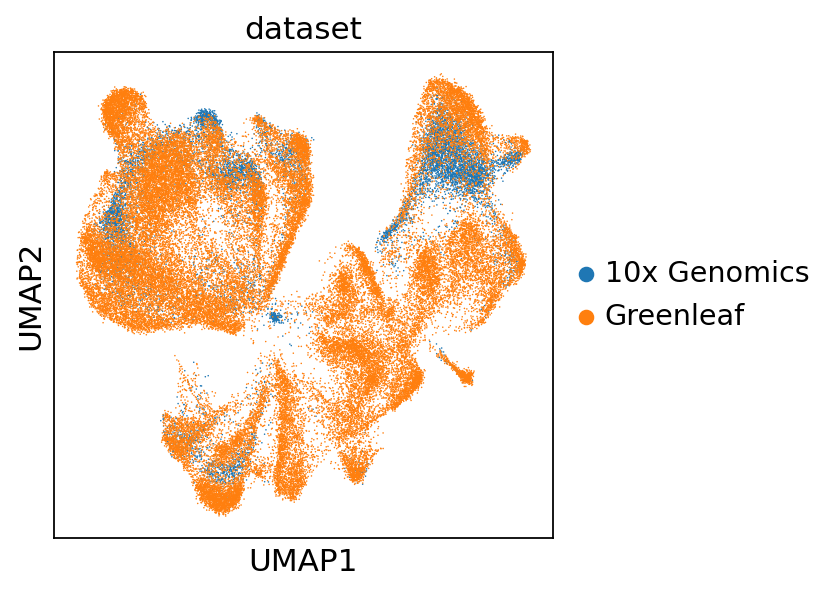

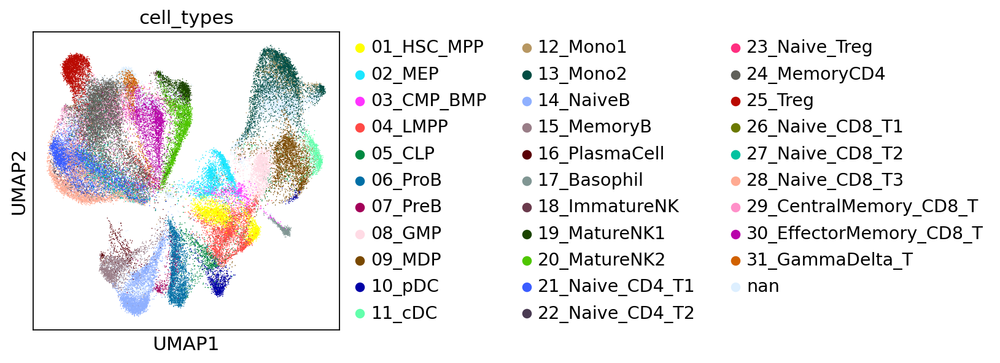

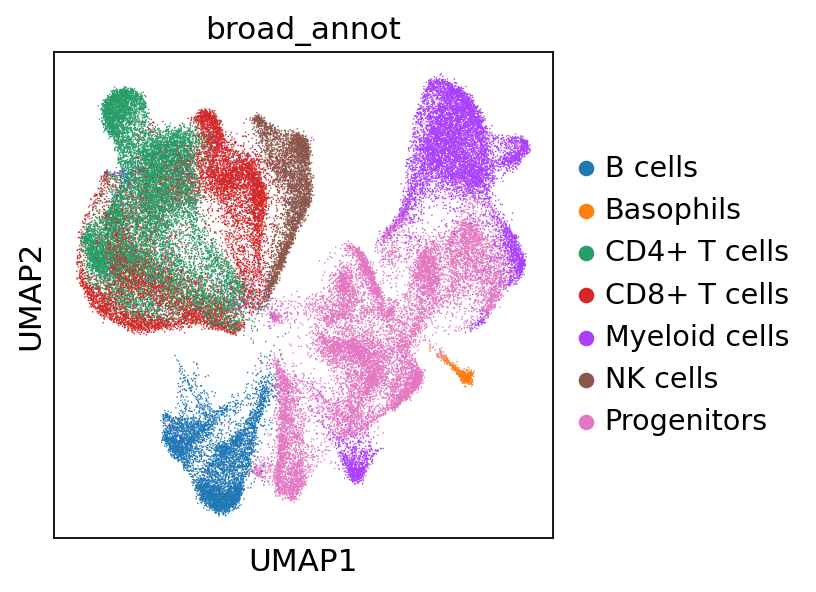

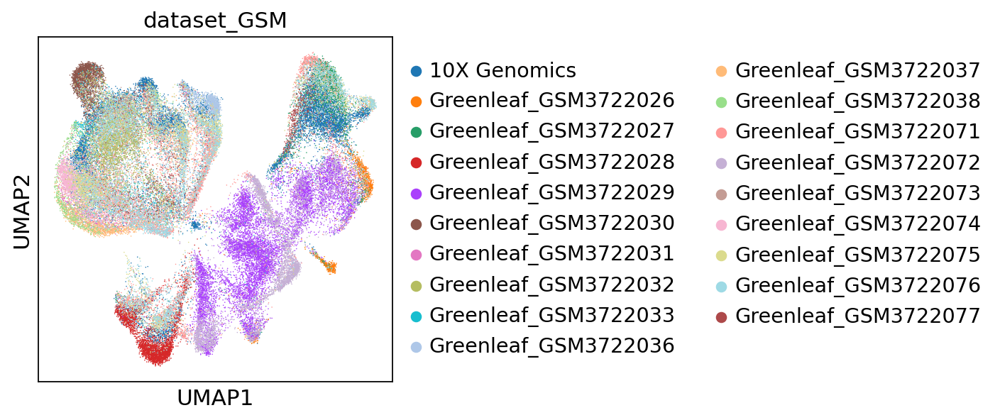

In [17]:
sc.pl.umap(adata, color=['dataset'], save='dataset_GSM_bbknn_dataset.png')
sc.pl.umap(adata, color=['cell_types'], save='dataset_GSM_bbknn_cell_types.png')
sc.pl.umap(adata, color=['broad_annot'], save='dataset_GSM_bbknn_broad_annot.png')
sc.pl.umap(adata, color=['dataset_GSM'], save='dataset_GSM_bbknn_dataset_GSM.png')

# integration on layer count

In [21]:
adata10_2 = adata10.copy()
adata10_2.X = adata10.layers['counts']
adata10_2

AnnData object with n_obs × n_vars = 10234 × 150513
    obs: 'nb_features', 'log_nb_features', 'n_counts', 'louvain', 'dataset', 'louvain10x', '10x_cell_type_annot', 'broad_annot'
    var: 'n_cells', 'commonness', 'prop_shared_cells', 'variability_score'
    uns: 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap', 'louvain10x_colors', '10x_cell_type_annot_colors'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [22]:
adataG_2 = adataG.copy()
adataG_2.X = adataG.layers['counts']
adataG_2

AnnData object with n_obs × n_vars = 52050 × 150051
    obs: 'batchname', 'nb_features', 'batch', 'GSM_id', 'file_name', 'cell_type', 'log_nb_features', 'n_counts', 'louvain', 'Group', 'clusters', 'cell_types', 'broad_annot', 'dataset', 'broad_annot_greenleaf'
    var: 'n_cells', 'commonness', 'prop_shared_cells', 'variability_score'
    uns: 'batchname_colors', 'broad_annot_colors', 'cell_type_colors', 'cell_types_colors', 'clusters_colors', 'louvain', 'louvain_colors', 'neighbors', 'pca', 'umap'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    varm: 'PCs'
    layers: 'counts'
    obsp: 'connectivities', 'distances'

In [25]:
adata2 = adata10_2.concatenate(adataG_2)
adata2

AnnData object with n_obs × n_vars = 62284 × 123280
    obs: 'nb_features', 'log_nb_features', 'n_counts', 'louvain', 'dataset', 'louvain10x', '10x_cell_type_annot', 'broad_annot', 'batchname', 'batch', 'GSM_id', 'file_name', 'cell_type', 'Group', 'clusters', 'cell_types', 'broad_annot_greenleaf'
    var: 'n_cells-0', 'commonness-0', 'prop_shared_cells-0', 'variability_score-0', 'n_cells-1', 'commonness-1', 'prop_shared_cells-1', 'variability_score-1'
    obsm: 'X_pca', 'X_tsne', 'X_umap'
    layers: 'counts'

In [30]:
annot = []
for n in adata2.obs['GSM_id']:
    if n == 'nan':
        annot.append('10X Genomics')
    else:
        annot.append('Greenleaf_'+n)
adata2.obs['dataset_GSM'] = annot

In [27]:
epi.pp.normalize_per_cell(adata2)
epi.pp.lazy(adata2)

... storing 'louvain' as categorical
... storing 'dataset' as categorical
... storing 'louvain10x' as categorical
... storing '10x_cell_type_annot' as categorical
... storing 'broad_annot' as categorical
... storing 'batchname' as categorical
... storing 'GSM_id' as categorical
... storing 'file_name' as categorical
... storing 'cell_type' as categorical
... storing 'Group' as categorical
... storing 'clusters' as categorical
... storing 'cell_types' as categorical
... storing 'broad_annot_greenleaf' as categorical


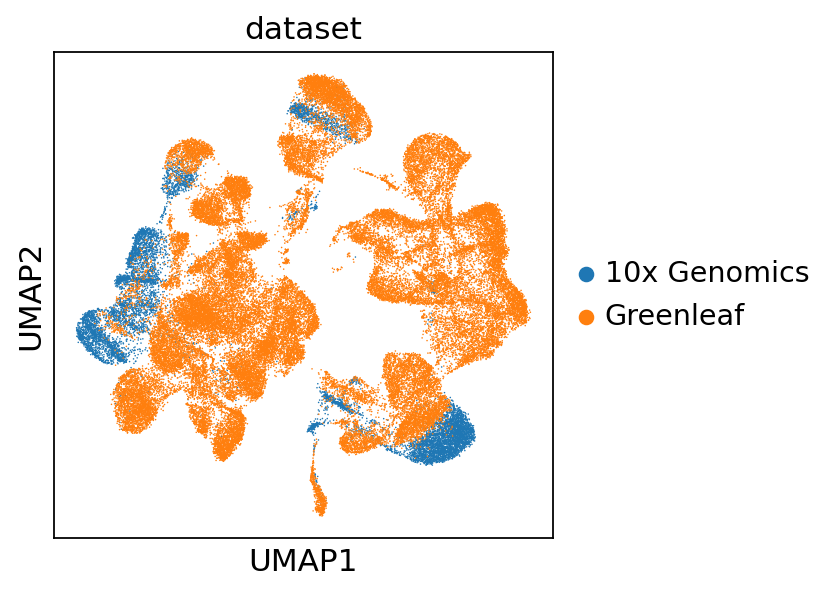

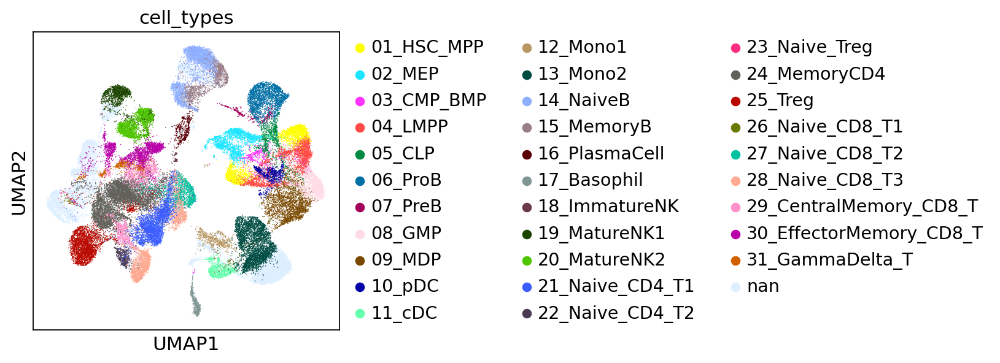

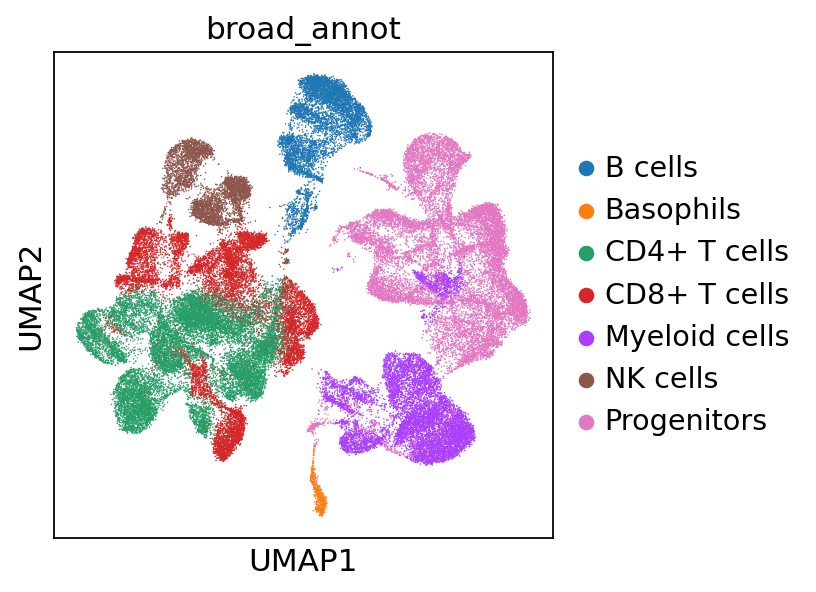

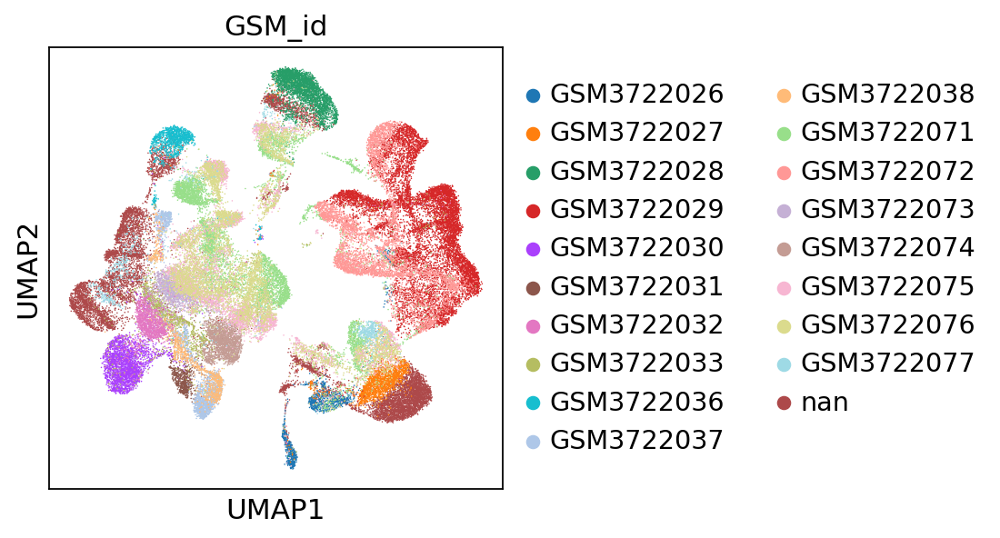

In [28]:
sc.pl.umap(adata2,
           color=['dataset'],
          ncols=1, save='pre_integration_count_greenleaf_10x_dataset.png')
sc.pl.umap(adata2,
           color=['cell_types'],
          ncols=1, save='pre_integration_count_greenleaf_10x_cell_types.png')
sc.pl.umap(adata2,
           color=['broad_annot'],
          ncols=1, save='pre_integration_count_greenleaf_10x_broad_annot.png')
sc.pl.umap(adata2,
           color=['GSM_id'],
          ncols=1, save='pre_integration_count_greenleaf_10x_GSM_id.png')

... storing 'dataset_GSM' as categorical


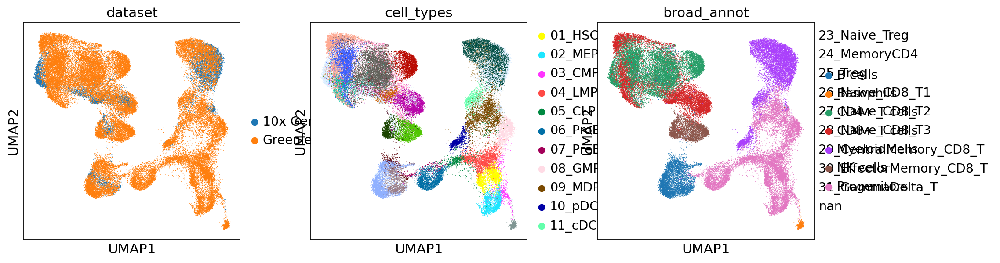

In [31]:
sce.pp.bbknn(adata2, batch_key='dataset_GSM')
sc.tl.umap(adata2)
sc.pl.umap(adata2, color=['dataset', 'cell_types', 'broad_annot'])

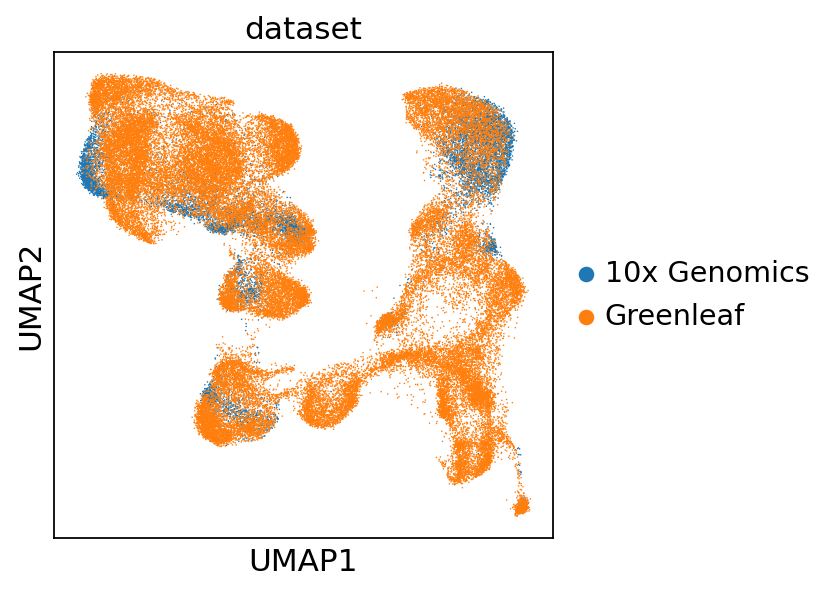

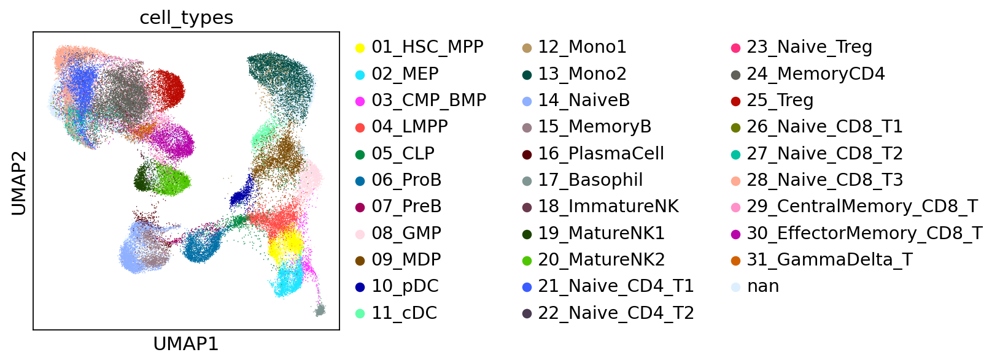

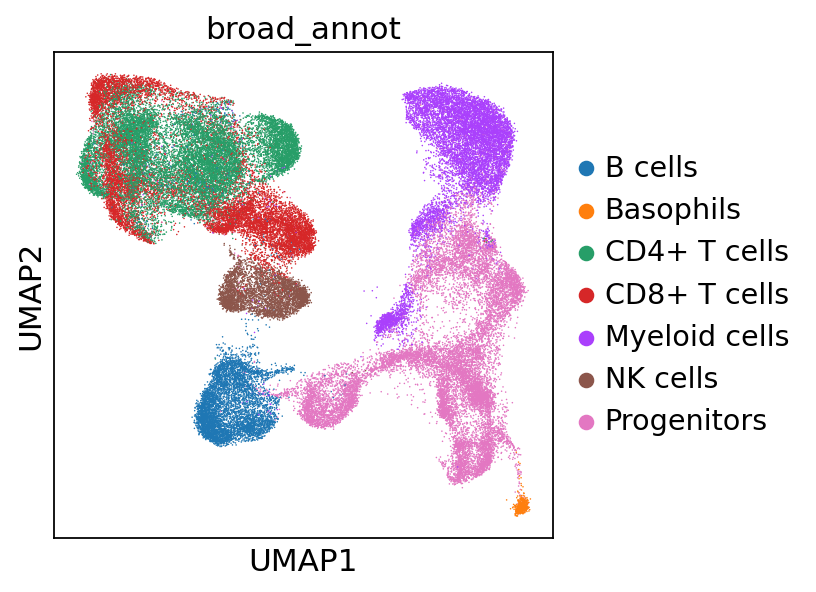

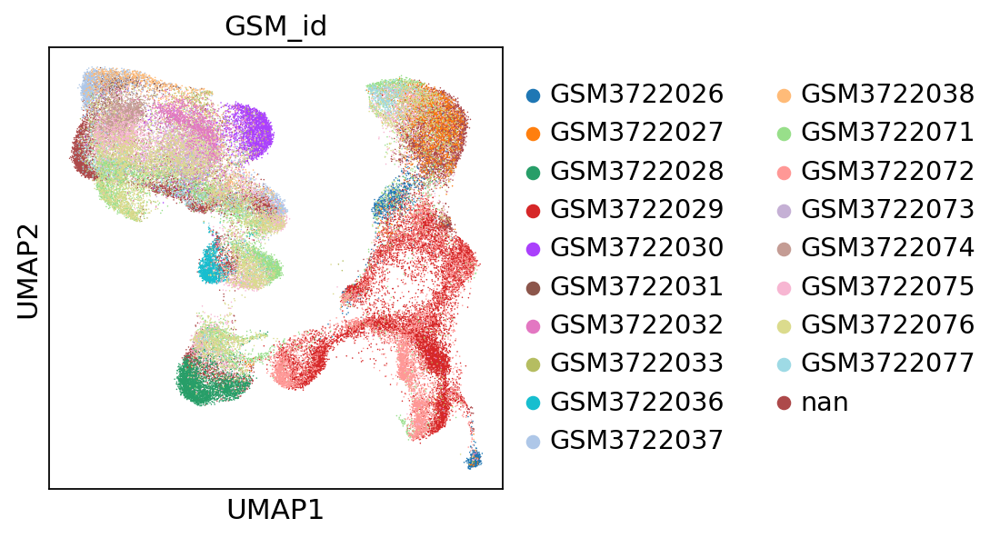

In [32]:
sc.pl.umap(adata2,
           color=['dataset'],
          ncols=1, save='post_integration_on_dataset_GSM_count_greenleaf_10x_dataset.png')
sc.pl.umap(adata2,
           color=['cell_types'],
          ncols=1, save='post_integration_on_dataset_GSM_count_greenleaf_10x_cell_types.png')
sc.pl.umap(adata2,
           color=['broad_annot'],
          ncols=1, save='post_integration_on_dataset_GSM_count_greenleaf_10x_broad_annot.png')
sc.pl.umap(adata2,
           color=['GSM_id'],
          ncols=1, save='post_integration_on_dataset_GSM_count_greenleaf_10x_GSM_id.png')